In [1]:
import sys
sys.path.append('/Users/koush/Projects/Banksy_py')
import scanpy as sc
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

sys.path.append('../../src')
sys.path.append('..')

In [2]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

In [3]:
from banksy_utils.load_data import load_adata, display_adata

In [4]:
adata = sc.read_h5ad('/Users/koush/Desktop/training_data/snrna_human_tonsil.h5ad')
adata

AnnData object with n_obs × n_vars = 5778 × 3549
    obs: 'cell_type', 'author_cell_type', 'cell_type_int'
    obsm: 'spatial'
    layers: 'imputed_count', 'normalized_count'

In [5]:
sc.pp.pca(adata, n_comps=50)
sc.pp.neighbors(adata, n_neighbors=7)
sc.tl.umap(adata, min_dist=0.5)


OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


In [6]:
import decoupler as dc
markers = dc.get_resource(
    name='PanglaoDB',
    organism='human',
    license='academic'
)

In [7]:
from spaceoracle.tools.utils import clean_leiden

In [26]:
sc.tl.leiden(adata, resolution=0.3, flavor="igraph")

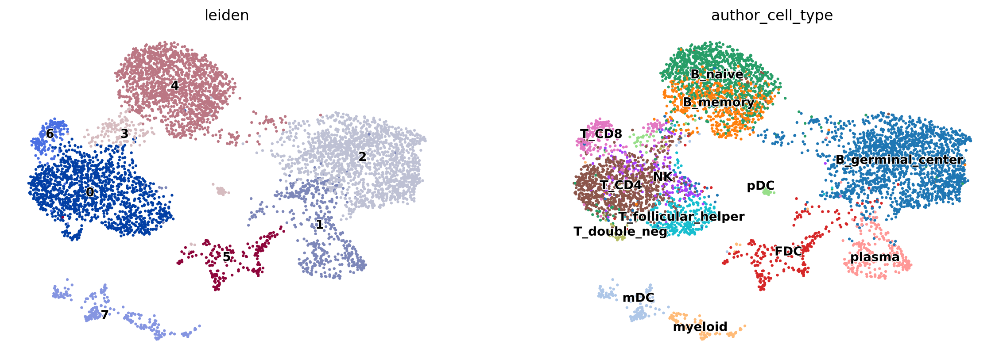

In [27]:
sc.pl.umap(
    adata, 
    color=['leiden', 'author_cell_type'], 
    frameon=False, legend_loc='on data', 
    legend_fontweight='bold', 
    legend_fontoutline=True, add_outline=False)

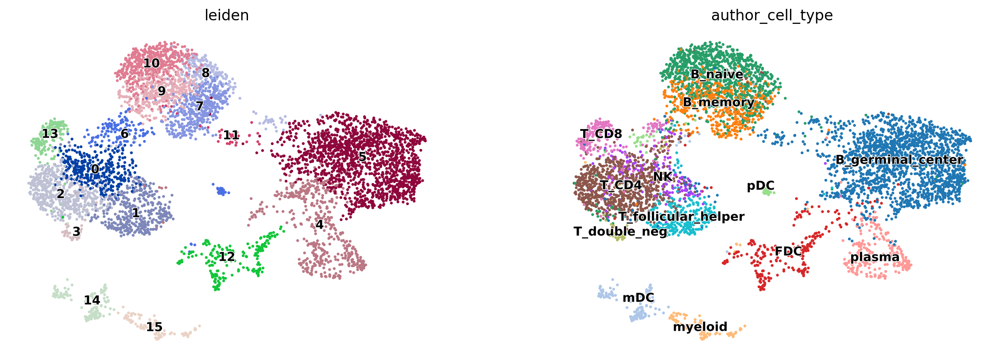

In [32]:
sc.tl.leiden(adata, resolution=0.3, flavor="igraph")
sc.tl.leiden(adata, resolution=0.4, restrict_to=('leiden', ['4']), flavor="igraph")
clean_leiden(adata)
sc.tl.leiden(adata, resolution=0.05, restrict_to=('leiden', ['11']), flavor="igraph")
clean_leiden(adata)
sc.tl.leiden(adata, resolution=0.3, restrict_to=('leiden', ['0']), flavor="igraph")
clean_leiden(adata)

# sc.tl.leiden(adata, resolution=0.1, restrict_to=('leiden', ['10']), flavor="igraph")
# clean_leiden(adata)

sc.pl.umap(
    adata, 
    color=['leiden', 'author_cell_type'], 
    frameon=False, legend_loc='on data', 
    legend_fontweight='bold', 
    legend_fontoutline=True, add_outline=False)

In [33]:
markers.organ.values.unique()

<StringArray>
['Immune system', 'Oral cavity', 'Thymus', 'Thyroid']
Length: 4, dtype: string

In [34]:
markers = markers[markers.organ.isin(['Oral cavity', 'Immune system', 'Thymus', 'Thyroid'])]
markers = markers[~markers.duplicated(['cell_type', 'genesymbol'])]
dc.run_ora(
    mat=adata,
    net=markers,
    source='cell_type',
    target='genesymbol',
    min_n=3,
    verbose=True,
    use_raw=False
)

Running ora on mat with 5778 samples and 3549 targets for 27 sources.


  0%|          | 0/5778 [00:00<?, ?it/s]

In [35]:
import numpy as np
acts = dc.get_acts(adata, obsm_key='ora_estimate')
acts_v = acts.X.ravel()
max_e = np.nanmax(acts_v[np.isfinite(acts_v)])
acts.X[~np.isfinite(acts.X)] = max_e
acts

AnnData object with n_obs × n_vars = 5778 × 27
    obs: 'cell_type', 'author_cell_type', 'cell_type_int', 'leiden', 'leiden_R'
    uns: 'pca', 'neighbors', 'umap', 'leiden', 'cell_type_colors', 'leiden_colors', 'leiden_R', 'author_cell_type_colors'
    obsm: 'spatial', 'X_pca', 'X_umap', 'ora_estimate', 'ora_pvals'

In [36]:
df = dc.rank_sources_groups(acts, groupby='leiden', reference='rest', method='t-test_overestim_var')
n_ctypes = 3
ctypes_dict = df.groupby('group').head(n_ctypes).groupby('group')['names'].apply(lambda x: list(x)).to_dict()

In [37]:
ctypes_dict

{'0': ['T memory cells', 'T cells', 'Nuocytes'],
 '1': ['T cells', 'T memory cells', 'T follicular helper cells'],
 '10': ['B cells naive', 'B cells memory', 'B cells'],
 '11': ['Macrophages', 'Dendritic cells', 'Myeloid-derived suppressor cells'],
 '12': ['Mast cells', 'Red pulp macrophages', 'Nuocytes'],
 '13': ['NK cells', 'T cells', 'Gamma delta T cells'],
 '14': ['Macrophages', 'Dendritic cells', 'Monocytes'],
 '15': ['Macrophages', 'Red pulp macrophages', 'Monocytes'],
 '2': ['T cells', 'T memory cells', 'Nuocytes'],
 '3': ['T cells', 'T memory cells', 'NK cells'],
 '4': ['Plasma cells', 'B cells', 'Plasmacytoid dendritic cells'],
 '5': ['B cells naive', 'B cells memory', 'Myeloid-derived suppressor cells'],
 '6': ['Plasmacytoid dendritic cells', 'Neutrophils', 'Monocytes'],
 '7': ['Follicular cells', 'B cells memory', 'Neutrophils'],
 '8': ['Follicular cells', 'T helper cells', 'Plasma cells'],
 '9': ['B cells memory', 'B cells naive', 'B cells']}

In [38]:
annotation_dict = df.groupby('group').head(1).set_index('group')['names'].to_dict()
annotation_dict

{'0': 'T memory cells',
 '1': 'T cells',
 '10': 'B cells naive',
 '11': 'Macrophages',
 '12': 'Mast cells',
 '13': 'NK cells',
 '14': 'Macrophages',
 '15': 'Macrophages',
 '2': 'T cells',
 '3': 'T cells',
 '4': 'Plasma cells',
 '5': 'B cells naive',
 '6': 'Plasmacytoid dendritic cells',
 '7': 'Follicular cells',
 '8': 'Follicular cells',
 '9': 'B cells memory'}

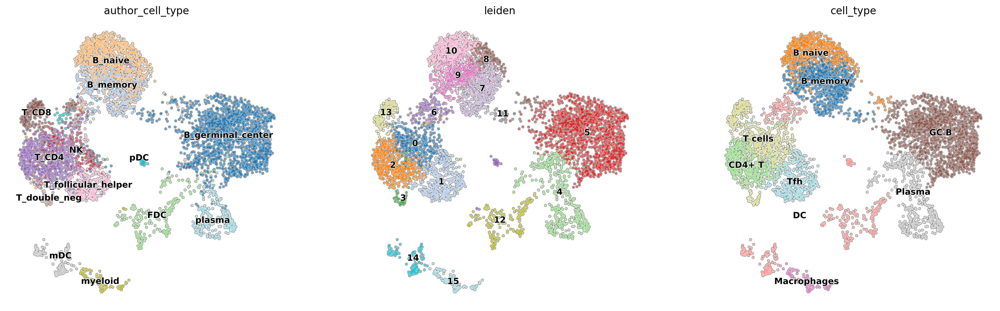

In [62]:
plt.rcParams['figure.figsize'] = (6, 6)
sc.pl.umap(adata, color=['author_cell_type', 'leiden', 'cell_type'], 
    frameon=False, legend_loc='on data', add_outline=True,
    legend_fontweight='bold', ncols=4, outline_width=(0.1, 0.1),
    legend_fontoutline=True, palette='tab20')

In [61]:
annotation_dict_2 = {
    '0': 'T memory',
    '1': 'Tfh',
    '10': 'B naive',
    '11': 'B memory',
    '12': 'fDC',
    '13': 'CD8+ T',
    '14': 'mDC',
    '15': 'Macrophages',
    '2': 'CD4+ T',
    '3': 'DN T',
    '4': 'Plasma',
    '5': 'GC B',
    '6': 'pDC',
    '7': 'B memory',
    '8': 'B naive',
    '9': 'B memory'
}

annotation_dict = {
    '0': 'T cells',
    '1': 'Tfh',
    '10': 'B naive',
    '11': 'B memory',
    '12': 'DC',
    '13': 'T cells',
    '14': 'DC',
    '15': 'Macrophages',
    '2': 'CD4+ T',
    '3': 'T cells',
    '4': 'Plasma',
    '5': 'GC B',
    '6': 'DC',
    '7': 'B memory',
    '8': 'B naive',
    '9': 'B memory'
}

adata.obs['cell_type'] = [annotation_dict[clust] for clust in adata.obs['leiden']]
adata.obs['cell_type_2'] = [annotation_dict_2[clust] for clust in adata.obs['leiden']]

In [63]:
from spaceoracle.tools.network import encode_labels

adata.obs['cell_type_int'] = adata.obs['cell_type'].apply(
    lambda x: encode_labels(adata.obs['cell_type'], reverse_dict=True)[x])

In [64]:
adata.write_h5ad('/Users/koush/Desktop/training_data/snrna_human_tonsil.h5ad')

In [49]:
sc.tl.dendrogram(acts, groupby='leiden')

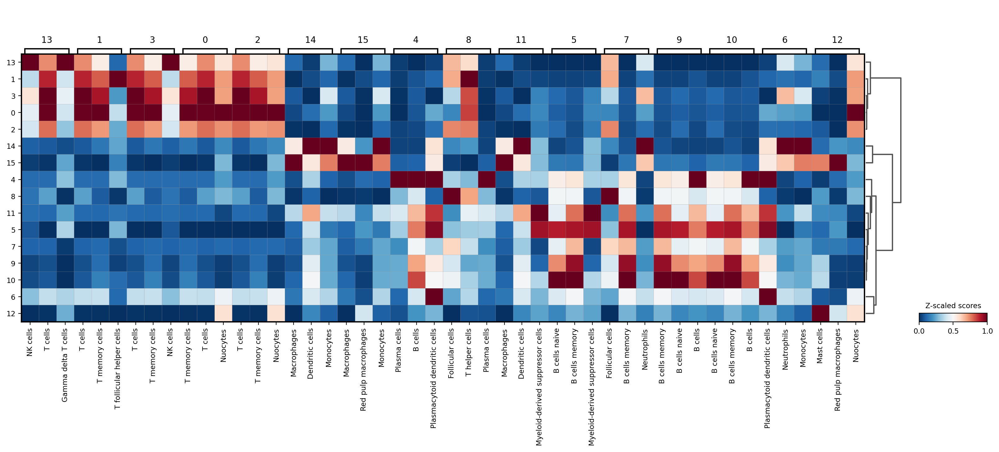

In [50]:
sc.pl.matrixplot(acts, ctypes_dict, 'leiden', dendrogram=True, standard_scale='var',
                 colorbar_title='Z-scaled scores', cmap='RdBu_r')

In [189]:
raw_x, raw_y = adata.obsm['spatial'][:, 0], adata.obsm['spatial'][:, 1]

In [190]:
# display_adata(adata)

In [191]:
from banksy.main import median_dist_to_nearest_neighbour

In [192]:
plot_graph_weights = True
k_geom = 15 # number of spatial neighbours
max_m = 1 # use both mean and AFT
nbr_weight_decay = "scaled_gaussian" # can also choose "reciprocal", "uniform" or "ranked"

# Find median distance to closest neighbours
nbrs = median_dist_to_nearest_neighbour(adata, key = 'spatial')


Median distance to closest cell = 13.162909136636577

---- Ran median_dist_to_nearest_neighbour in 0.02 s ----



In [193]:
adata.obs['x'] = raw_x
adata.obs['y'] = raw_y


Median distance to closest cell = 13.162909136636577

---- Ran median_dist_to_nearest_neighbour in 0.01 s ----

---- Ran generate_spatial_distance_graph in 0.02 s ----

---- Ran row_normalize in 0.01 s ----

---- Ran generate_spatial_weights_fixed_nbrs in 0.08 s ----

----- Plotting Edge Histograms for m = 0 -----

Edge weights (distances between cells): median = 44.51081302877048, mode = 45.529551911354226

---- Ran plot_edge_histogram in 0.02 s ----


Edge weights (weights between cells): median = 0.05772687203986537, mode = 0.041943398344353615

---- Ran plot_edge_histogram in 0.02 s ----

---- Ran generate_spatial_distance_graph in 0.03 s ----

---- Ran theta_from_spatial_graph in 0.03 s ----

---- Ran row_normalize in 0.01 s ----

---- Ran generate_spatial_weights_fixed_nbrs in 0.12 s ----

----- Plotting Edge Histograms for m = 1 -----

Edge weights (distances between cells): median = 63.39150538356155, mode = 69.48229249993267

---- Ran plot_edge_histogram in 0.02 s ----


Edge

/opt/homebrew/Caskroom/miniforge/base/envs/SpaceOracle/lib/python3.9/site-packages/matplotlib/cbook.py:1762: ComplexWarning: Casting complex values to real discards the imaginary part
/opt/homebrew/Caskroom/miniforge/base/envs/SpaceOracle/lib/python3.9/site-packages/numpy/lib/histograms.py:841: ComplexWarning: Casting complex values to real discards the imaginary part
/opt/homebrew/Caskroom/miniforge/base/envs/SpaceOracle/lib/python3.9/site-packages/matplotlib/axes/_axes.py:7004: ComplexWarning: Casting complex values to real discards the imaginary part
/opt/homebrew/Caskroom/miniforge/base/envs/SpaceOracle/lib/python3.9/site-packages/matplotlib/cbook.py:1398: ComplexWarning: Casting complex values to real discards the imaginary part


Maximum weight: 0.20946115918648542

---- Ran plot_graph_weights in 0.39 s ----

Maximum weight: (0.09135479832004889+0.0142108386170042j)

---- Ran plot_graph_weights in 0.97 s ----

----- Plotting theta Graph -----


/opt/homebrew/Caskroom/miniforge/base/envs/SpaceOracle/lib/python3.9/site-packages/matplotlib/collections.py:426: ComplexWarning: Casting complex values to real discards the imaginary part


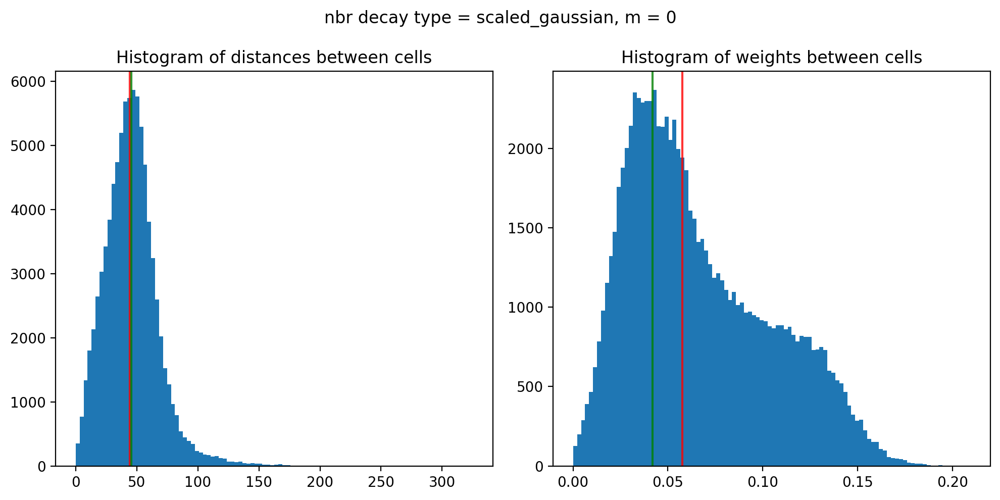

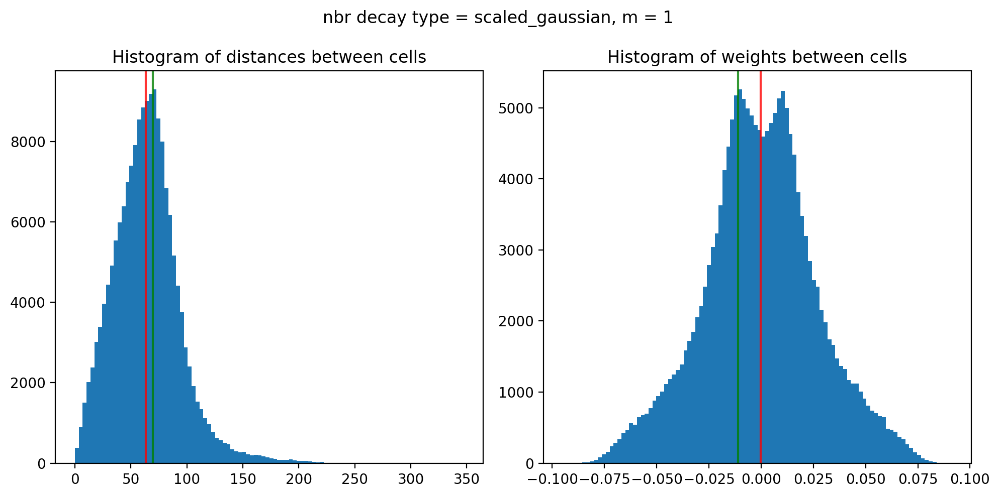

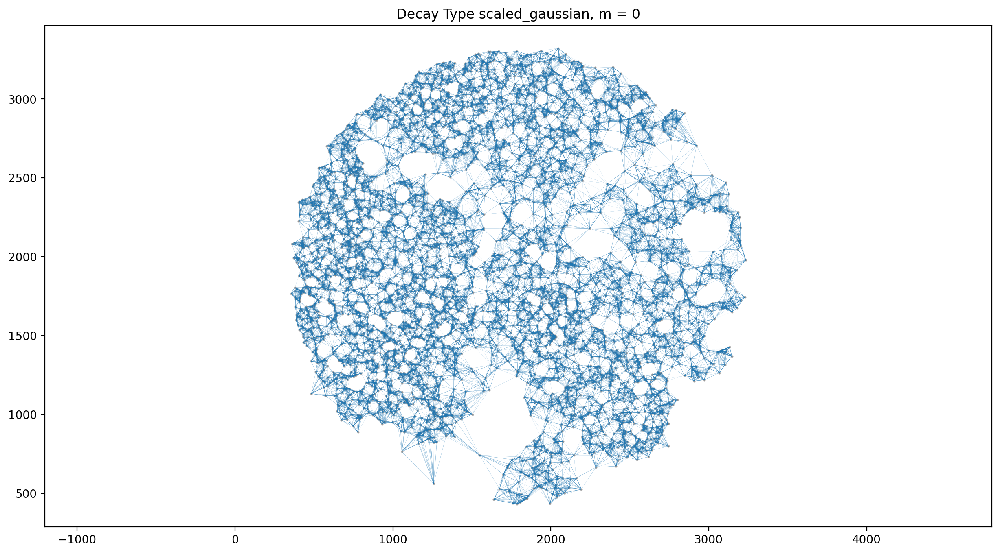

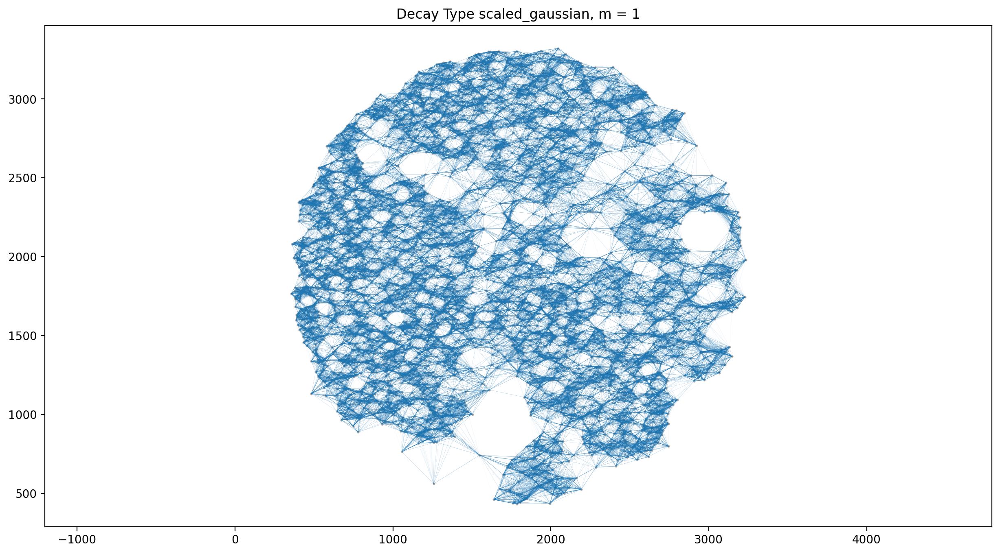

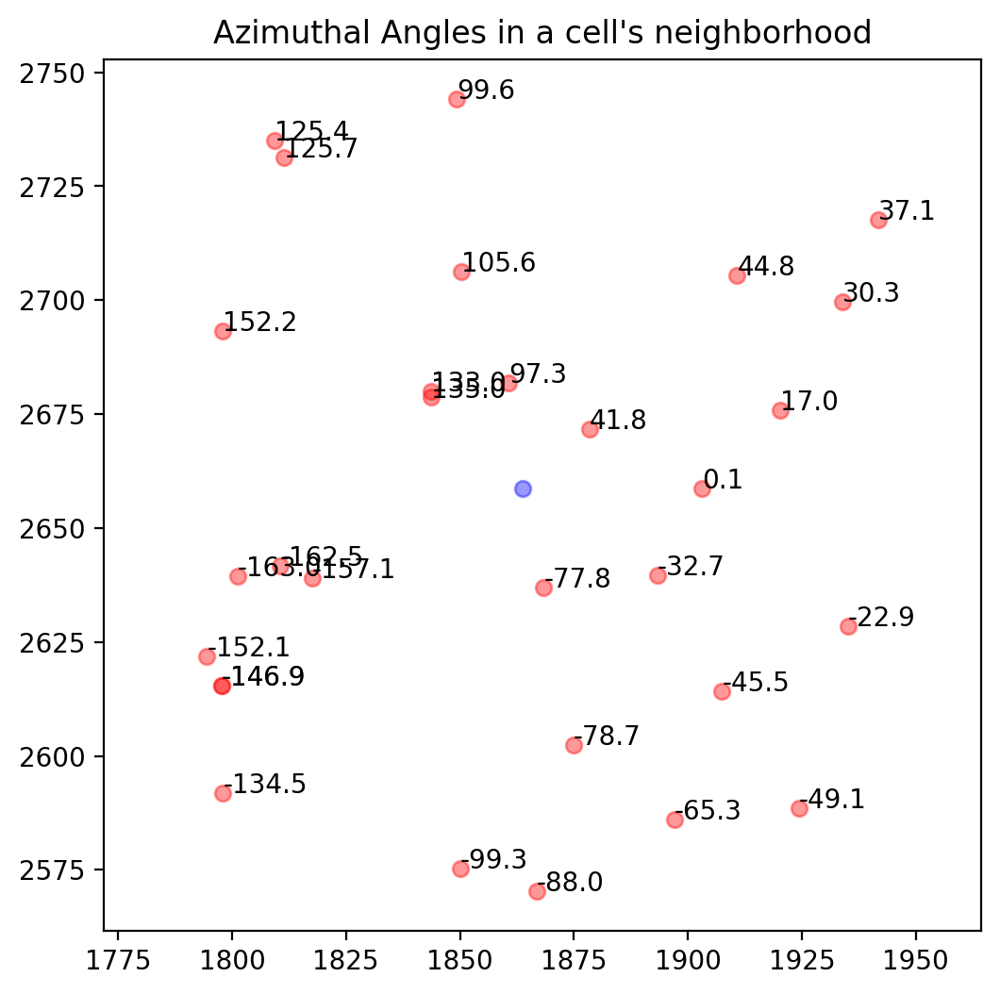

In [194]:
from banksy.initialize_banksy import initialize_banksy

banksy_dict = initialize_banksy(
    adata,
    ('x', 'y', 'spatial'),
    k_geom,
    nbr_weight_decay=nbr_weight_decay,
    max_m=max_m,
    plt_edge_hist=True,
    plt_nbr_weights=True,
    plt_agf_angles=False, # takes long time to plot
    plt_theta=True,
)

In [217]:
from banksy.embed_banksy import generate_banksy_matrix

# The following are the main hyperparameters for BANKSY
# -----------------------------------------------------
resolutions = [1.0]  # clustering resolution for UMAP
pca_dims = [50]  # Dimensionality in which PCA reduces to
lambda_list = [0.2]  # list of lambda parameters

banksy_dict, banksy_matrix = generate_banksy_matrix(adata,
                                                    banksy_dict,
                                                    lambda_list,
                                                    max_m)
banksy_matrix

Runtime Feb-23-2025-21-16

3549 genes to be analysed:
Gene List:
Index(['LINC01128', 'FAM41C', 'PLEKHN1', 'LINC01342', 'TNFRSF4', 'SCNN1D',
       'INTS11', 'MRPL20-AS1', 'ATAD3C', 'SKI',
       ...
       'MPP1', 'F8', 'F8A1', 'CLIC2', 'ZFY-AS1', 'LINC00278', 'PCDH11Y',
       'NLGN4Y', 'TTTY14', 'TTTY10'],
      dtype='object', name='Unnamed: 0', length=3549)

Decay Type: scaled_gaussian
Weights Object: {'weights': {0: <5778x5778 sparse matrix of type '<class 'numpy.float64'>'
	with 86670 stored elements in Compressed Sparse Row format>, 1: <5778x5778 sparse matrix of type '<class 'numpy.complex128'>'
	with 173340 stored elements in Compressed Sparse Row format>}, 'norm_counts_concatenated': array([[0.        , 0.        , 0.        , ..., 0.09719611, 0.05134671,
        0.15568715],
       [0.        , 0.        , 0.        , ..., 0.02099579, 0.11508084,
        0.06329367],
       [0.88378866, 0.        , 0.        , ..., 0.13055805, 0.0712133 ,
        0.03049477],
       ...,
   

AnnData object with n_obs × n_vars = 5778 × 10647
    obs: 'cell_type', 'cell_type_int', 'leiden', 'leiden_R', 'cell_type_2', 'x', 'y', 'banksy_cluster'
    var: 'is_nbr', 'k'

In [218]:
# from banksy.main import concatenate_all

# banksy_dict["nonspatial"] = {
#     # Here we simply append the nonspatial matrix (adata.X) to obtain the nonspatial clustering results
#     0.0: {"adata": concatenate_all([adata.X], 0, adata=adata), }
# }

# print(banksy_dict['nonspatial'][0.0]['adata'])

In [219]:
from banksy_utils.umap_pca import pca_umap

pca_umap(banksy_dict,
         pca_dims = pca_dims,
         add_umap = True,
         plt_remaining_var = False,
         )

Current decay types: ['scaled_gaussian']

Reducing dims of dataset in (Index = scaled_gaussian, lambda = 0.2)

Setting the total number of PC = 50
Original shape of matrix: (5778, 10647)
Reduced shape of matrix: (5778, 50)
------------------------------------------------------------
min_value = -52.965323304773975, mean = -9.94612261479351e-17, max = 81.46559389363485

Conducting UMAP and adding embeddings to adata.obsm["reduced_pc_50_umap"]
UMAP embedding
------------------------------------------------------------
shape: (5778, 2)


AxisArrays with keys: reduced_pc_50, reduced_pc_50_umap


In [220]:
from banksy.cluster_methods import run_Leiden_partition

results_df, max_num_labels = run_Leiden_partition(
    banksy_dict,
    resolutions,
    num_nn = 50, # k_expr: number of neighbours in expression (BANKSY embedding or non-spatial) space
    num_iterations = -1, # run to convergenece
    partition_seed = 42,
    match_labels = True,
)

Decay type: scaled_gaussian
Neighbourhood Contribution (Lambda Parameter): 0.2
reduced_pc_50 

reduced_pc_50_umap 

PCA dims to analyse: [50]

Setting up partitioner for (nbr decay = scaled_gaussian), Neighbourhood contribution = 0.2, PCA dimensions = 50)


Nearest-neighbour weighted graph (dtype: float64, shape: (5778, 5778)) has 288900 nonzero entries.
---- Ran find_nn in 0.74 s ----


Nearest-neighbour connectivity graph (dtype: int16, shape: (5778, 5778)) has 288900 nonzero entries.

(after computing shared NN)
Allowing nearest neighbours only reduced the number of shared NN from 3613750 to 287965.


Shared nearest-neighbour (connections only) graph (dtype: int16, shape: (5778, 5778)) has 278152 nonzero entries.

Shared nearest-neighbour (number of shared neighbours as weights) graph (dtype: int16, shape: (5778, 5778)) has 278152 nonzero entries.

sNN graph data:
[20 21 15 ... 18 12 14]

---- Ran shared_nn in 0.13 s ----


-- Multiplying sNN connectivity by weights --


shared NN w

/Users/koush/Projects/Banksy_py/banksy/labels.py:398: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`


,decay,lambda_param,num_pcs,resolution,num_labels,labels,adata,relabeled
scaled_gaussian_pc50_nc0.20_r1.00,scaled_gaussian,0.2,50,1.0,13,"Label object:\nNumber of labels: 13, number of...",[[[View of AnnData object with n_obs × n_vars ...,"Label object:\nNumber of labels: 13, number of..."


number of labels: 13
---- Ran plot_2d_embeddings in 0.00 s ----

number of labels: 13
---- Ran plot_2d_embeddings in 0.00 s ----

number of labels: 13
---- Ran plot_2d_embeddings in 0.00 s ----

---- Ran row_normalize in 0.00 s ----


matrix multiplying labels x weights x labels-transpose ((13, 5778) x (5778, 5778) x (5778, 13))



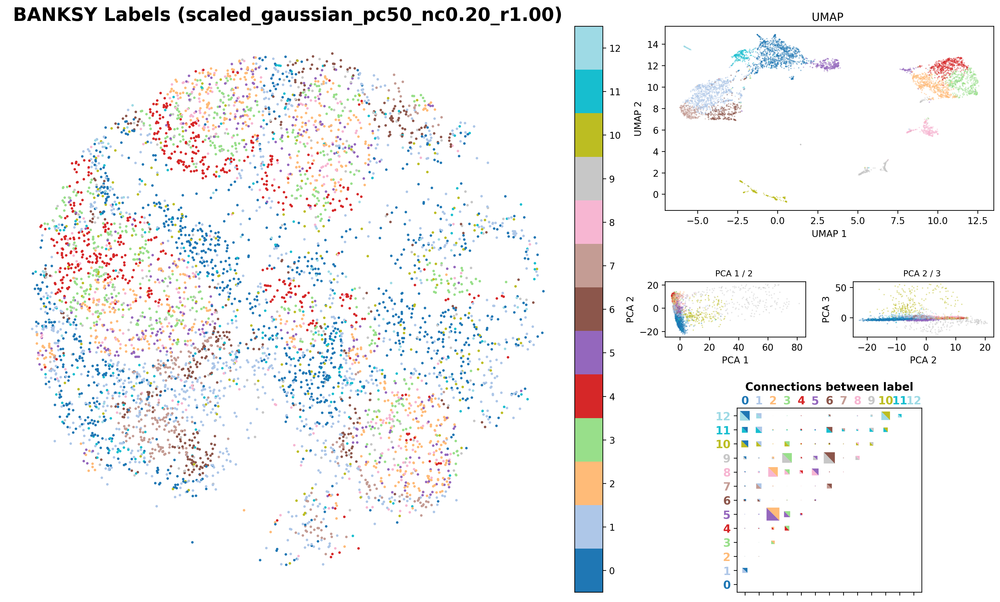

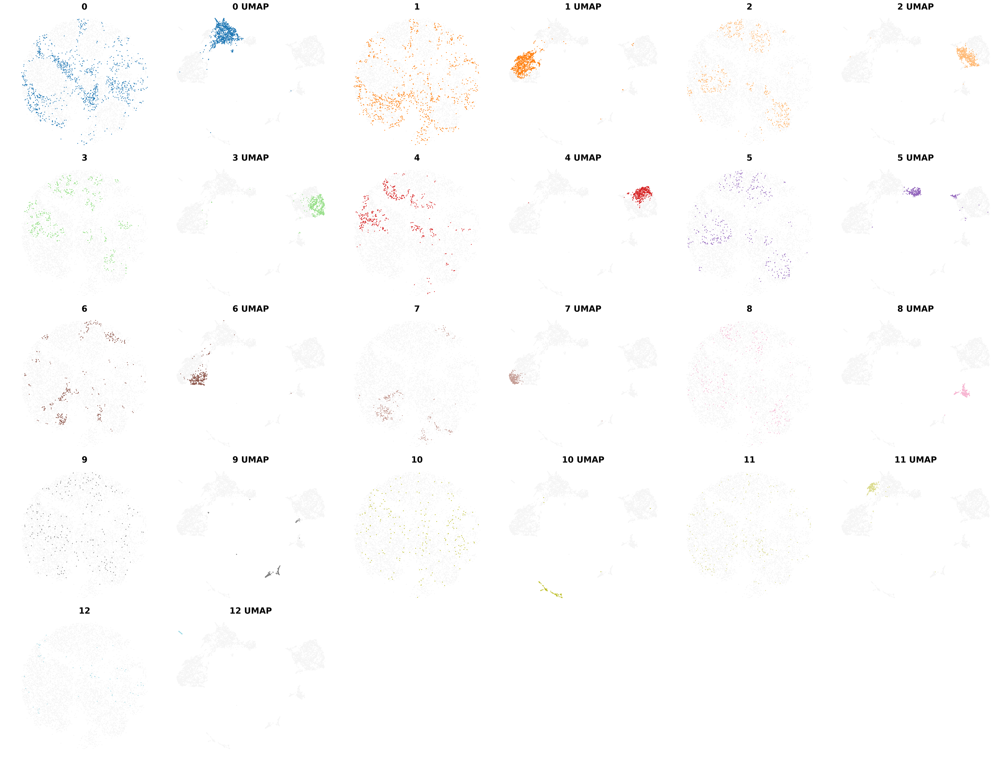

In [221]:
from banksy.plot_banksy import plot_results

c_map =  'tab20' # specify color map
weights_graph =  banksy_dict['scaled_gaussian']['weights'][0]

plot_results(
    results_df,
    weights_graph,
    c_map,
    match_labels = True,
    coord_keys = ('x', 'y', 'spatial'),
    max_num_labels  =  max_num_labels, 
    save_path = '/tmp',
    save_fig = False
)

In [222]:
results_df.iloc[0].adata.obs

,cell_type,cell_type_int,leiden,leiden_R,cell_type_2,x,y,banksy_cluster,labels_scaled_gaussian_pc50_nc0.20_r1.00
NAME,,,,,,,,,
AAACCCAAGCGCCTTG-1,T_CD4,5,0,0,CD4+ T cells,1733.213235,1665.039824,0,0
AAACCCAAGTGGACGT-1,plasma,12,8,8,Plasma cells,519.377858,2220.266321,9,8
AAACCCACAGAAGTGC-1,B_germinal_center,0,9,9,B cells memory,1064.296595,2158.266703,2,4
AAACCCAGTCATTGCA-1,B_naive,2,10,"10,0",Dendritic cells,1740.127314,3218.472808,1,1
AAACCCATCATCGCAA-1,B_memory,1,13,11,B cells naive,930.600158,2892.947737,5,6
...,...,...,...,...,...,...,...,...,...
TTTGTTGCAGGGACTA-1,B_germinal_center,0,9,9,B cells memory,1699.607471,1920.402412,2,4
TTTGTTGCATTGTAGC-1,plasma,12,8,8,Plasma cells,688.211974,2794.005768,9,8
TTTGTTGGTACCACGC-1,B_germinal_center,0,9,9,B cells memory,1258.258885,2713.702000,7,4


In [223]:
label = 'labels_scaled_gaussian_pc50_nc0.20_r1.00'

In [224]:
adata.obs['banksy_cluster'] = results_df.iloc[0].adata.obs.loc[adata.obs_names][label].copy()

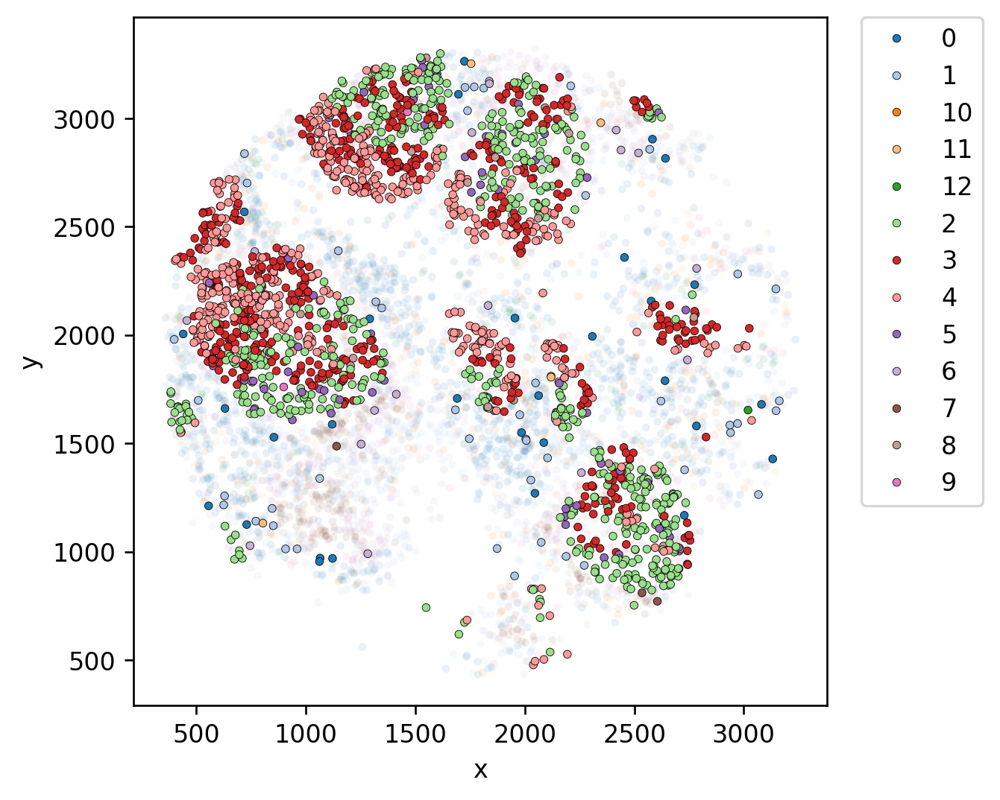

In [225]:
plt.rcParams['figure.figsize'] = (5, 5)
plt.rcParams['figure.dpi'] = 120

sns.scatterplot(
    data=adata.obs, 
    x='x', y='y', hue='banksy_cluster', s=10, 
    legend=False, palette='tab20', alpha=0.1)

sns.scatterplot(
    data=adata.obs[adata.obs.cell_type.isin(['B_germinal_center'])], 
    x='x', y='y', hue='banksy_cluster', s=10, linewidth=0.25, edgecolor='black',
    legend=True, palette='tab20')

plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)

In [226]:
from scipy.stats import chi2_contingency
import numpy as np

In [227]:
# Calculate contingency table and chi-square test for correlation between categorical variables
contingency_table = pd.crosstab(adata.obs['cell_type_2'], adata.obs['banksy_cluster'])
chi2, p_value = chi2_contingency(contingency_table)[:2]

print("Chi-square test results:")
print(f"Chi-square statistic: {chi2:.2f}")
print(f"p-value: {p_value:.2e}")

# Calculate Cramer's V correlation coefficient
n = contingency_table.sum().sum()
min_dim = min(contingency_table.shape) - 1
cramer_v = np.sqrt(chi2 / (n * min_dim))

Chi-square test results:
Chi-square statistic: 34427.01
p-value: 0.00e+00


In [228]:
contingency_table

banksy_cluster,0,1,10,11,12,2,3,4,5,6,7,8,9
cell_type_2,,,,,,,,,,,,,
B cells memory,12,451,1,3,3,615,517,521,70,146,35,5,27
B cells naive,13,494,0,0,0,3,1,0,0,182,238,0,0
CD4+ T cells,291,0,0,3,0,0,0,0,6,0,0,0,0
CD8+ T cells,21,1,0,154,0,0,0,0,0,2,0,0,0
DN T cells,36,0,0,0,0,0,0,0,0,0,0,0,0
Dendritic cells,30,29,4,29,1,0,1,0,0,8,4,0,0
Follicular Dendritic cells,2,2,0,1,0,0,0,0,0,0,1,0,203
Macrophages,0,35,100,0,0,0,0,0,0,6,0,0,0
Myleoid Dendritic cells,2,1,117,0,0,0,0,0,0,1,0,0,0


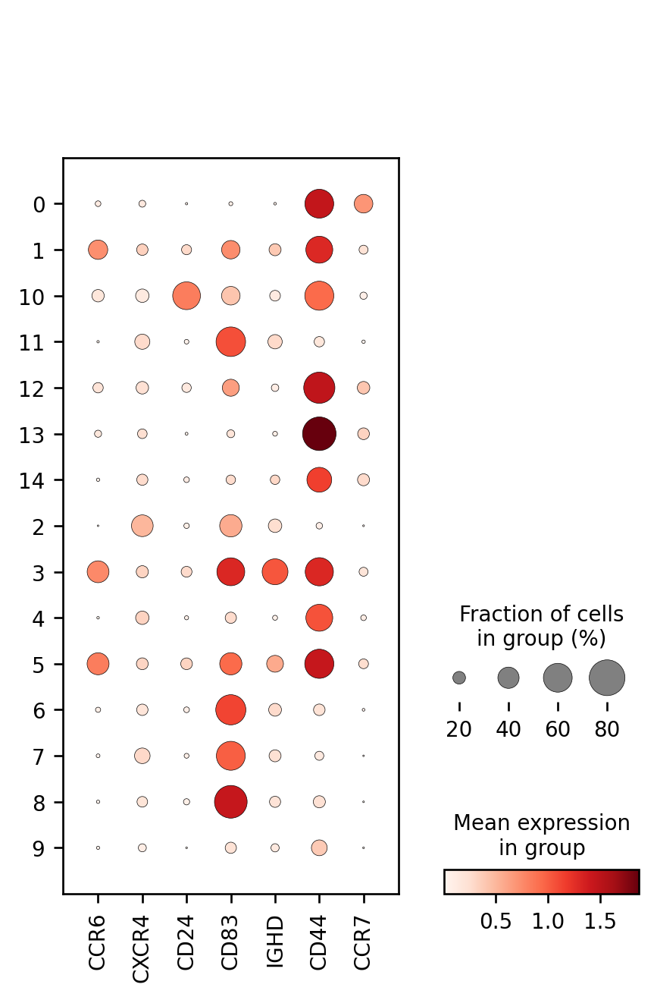

In [214]:
# Get B memory vs B naive cells
b_cells = adata.obs[adata.obs.cell_type.isin(['B_memory', 'B_naive'])]

# Plot marker gene expression
marker_genes = ['CCR6', 'CXCR4','CD24', 'CD83',
    'IGHD', 'CD44', 'CCR7']  # Key marker genes distinguishing memory vs naive B cells

sc.pl.dotplot(adata, marker_genes, groupby='banksy_cluster', dendrogram=False)


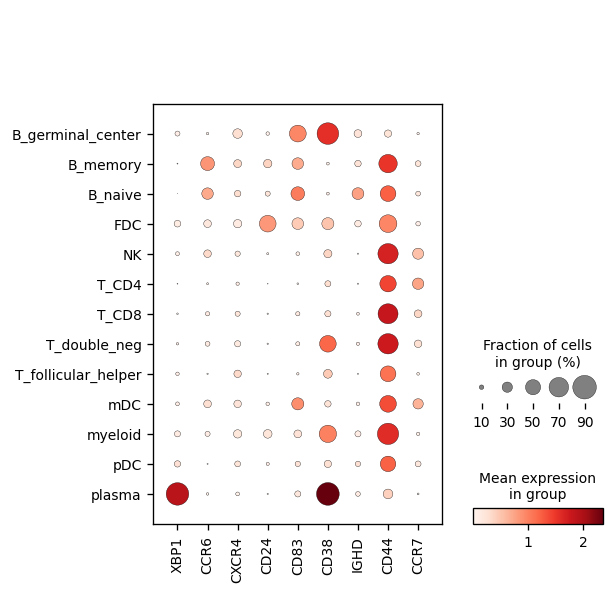

In [124]:
# Get B memory vs B naive cells
b_cells = adata.obs[adata.obs.cell_type.isin(['B_memory', 'B_naive'])]

# Plot marker gene expression
marker_genes = ['XBP1', 'CCR6', 'CXCR4','CD24', 'CD83',
    'CD38', 'IGHD', 'CD44', 'CCR7']  # Key marker genes distinguishing memory vs naive B cells

sc.pl.dotplot(adata, marker_genes, groupby='cell_type', dendrogram=False)


In [128]:
banksy2ct = {
    0: 'T_CD4',
    1: 'B_memory',
    2: 'GC Light Zone',
    3: 'GC Dark Zone',
    4: 'B_naive',
    5: 'T_follicular_helper',
    6: 'B_naive',
    7: 'GC Intermediate Zone',
    8: 'plasma',
    9: 'mDC/myeloid',
    10: 'FDC',
    11: 'T_CD8',
    12: 'GC Intermediate Zone',
    13: 'pDC',
    14: 'GC Light Zone', 
}

In [134]:
adata.obs['banksy_celltypes'] = adata.obs['banksy_cluster'].astype(int).map(banksy2ct)
adata.obs['banksy_celltypes']  = adata.obs['banksy_celltypes'].astype('category')

In [141]:
adata.obs['banksy_celltypes'].unique()

['T_CD4', 'plasma', 'GC Light Zone', 'B_memory', 'GC Intermediate Zone', ..., 'FDC', 'B_naive', 'T_CD8', 'mDC/myeloid', 'pDC']
Length: 12
Categories (12, object): ['B_memory', 'B_naive', 'FDC', 'GC Dark Zone', ..., 'T_follicular_helper', 'mDC/myeloid', 'pDC', 'plasma']

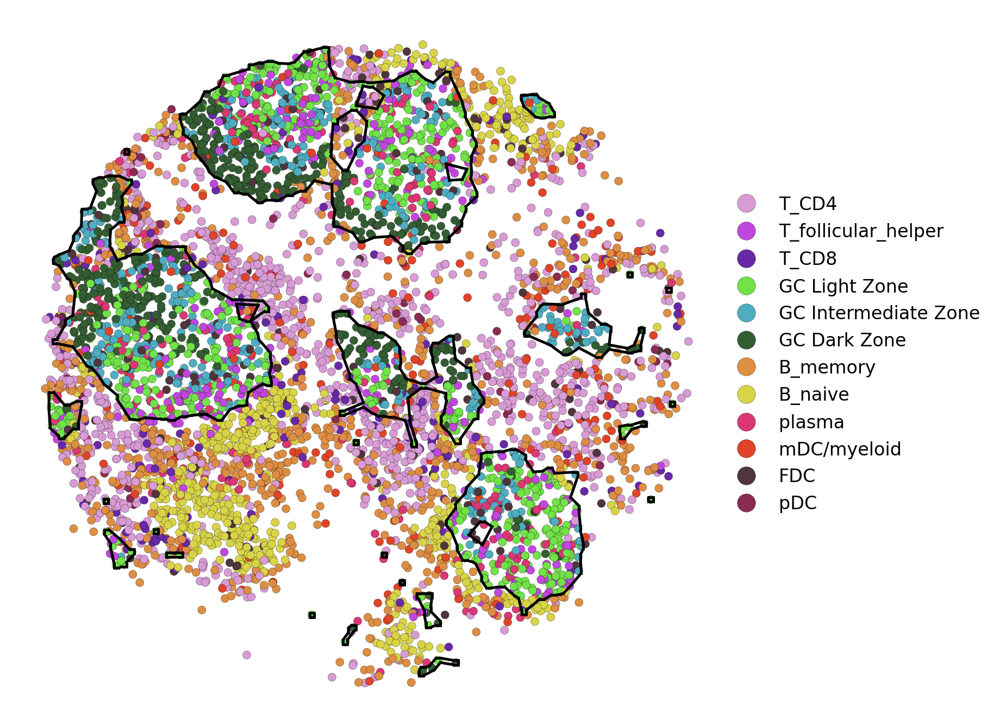

In [216]:
plt.rcParams['figure.figsize'] = (9.25, 9)
plt.rcParams['figure.dpi'] = 120
label = 'labels_scaled_gaussian_pc50_nc0.20_r0.90'

color_dict = {
    'T_CD4': "#d89bd5",
    'T_follicular_helper': "#c047dd", 
    'T_CD8': "#6729a7",
    'GC Light Zone': "#71e248",
    'GC Intermediate Zone': "#4fadc1",
    'GC Dark Zone': "#345d33",
    'B_memory': "#dd8e43",
    'B_naive': "#d9d447", 
    'plasma': "#db3774",
    'mDC/myeloid': "#e04327",
    'FDC': "#50363c",
    'pDC': "#8a2b52"
}
f, ax = plt.subplots(1, 1, figsize=(7, 7), dpi=120)



points = np.asarray(
    adata[adata.obs['banksy_celltypes'].str.contains('GC')].obsm['spatial'])
delta = 10
points = np.vstack(
    (points +[-delta,delta], points +[-delta,-delta], points +[delta,delta], points +[delta,-delta]))

edges = alpha_shape(points, alpha=50, only_outer=True)

for ii, jj in edges:
    ax.plot(points[[ii, jj], 0], points[[ii, jj], 1], 'k', linewidth=1.5)
    
g = sns.scatterplot(
    data=adata.obs, ax=ax,
    x='x', y='y', hue='banksy_celltypes', s=20,
    legend=True, palette=color_dict, alpha=1,
    edgecolor='black', linewidth=0.1, 
    # style='banksy_celltypes'
)


handles, labels = g.get_legend_handles_labels()
label_handle_map = dict(zip(labels, handles))
ordered_handles = [label_handle_map[key] for key in color_dict.keys()]
plt.legend(handles=ordered_handles, labels=color_dict.keys(), 
          bbox_to_anchor=(1, 0.75), loc='upper left',
          borderaxespad=0., frameon=False, fontsize=10, markerscale=2.25)

    
plt.gca().set_frame_on(False)
plt.xticks([])
plt.yticks([])
plt.xlabel('')
plt.ylabel('')
plt.show()

In [279]:
adata.obs[['banksy_celltypes']].to_csv('/tmp/banksy_celltypes.csv')

In [232]:
sc.pp.neighbors(adata, use_rep='X')

In [256]:
sc.tl.umap(adata, min_dist=0.5, spread=1)

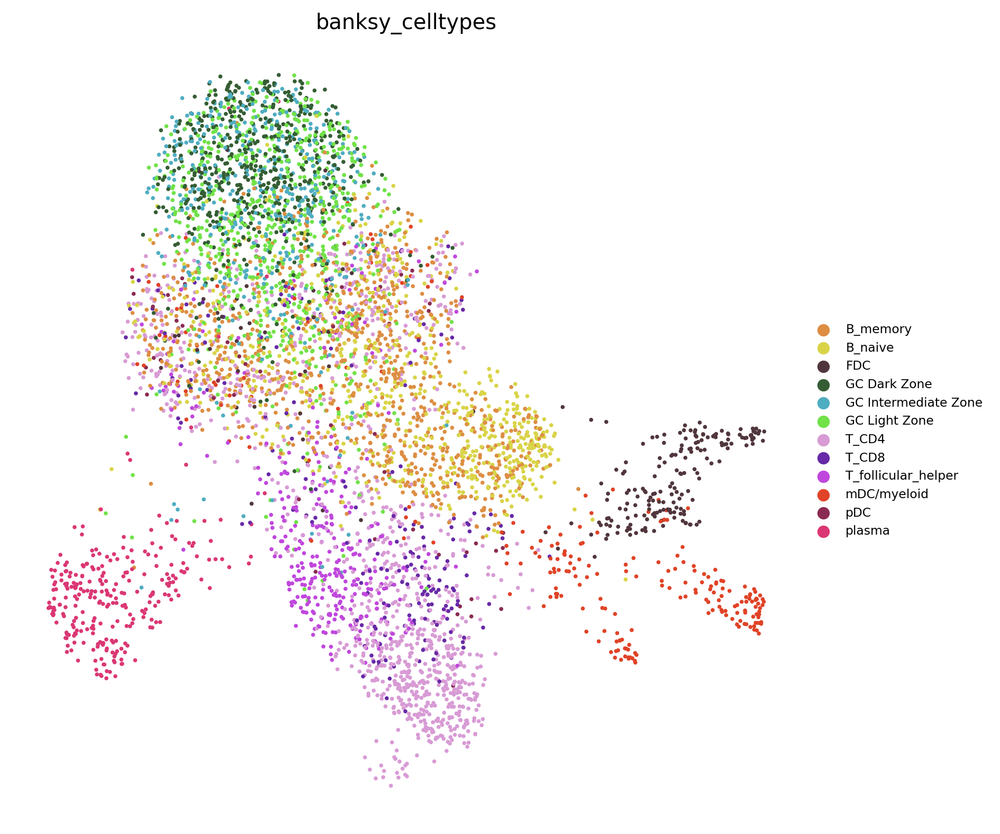

In [276]:
plt.rcParams['figure.figsize'] = (8, 8)
ax = sc.pl.umap(adata, color='banksy_celltypes', 
    legend_fontsize=7, palette=color_dict, frameon=False,
    show=False)